<a href="https://colab.research.google.com/github/afvallejo/covid_DC/blob/main/3_Annotattion_cellranger_Covid_DC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

## link Gdrive

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
!mkdir MyDrive
!mount --bind /content/drive/My\ Drive /content/MyDrive

#Colab

In [ ]:
%cd /content/

/content


In [ ]:
import gdown
#https://drive.google.com/uc?id=
gdown.download(url="https://drive.google.com/uc?id=17OU7OpLv-v_0tE-41HsWIxge4rs22YpR", 
               output="scanpy.zip", quiet=False)

Downloading...
From: https://drive.google.com/uc?id=17OU7OpLv-v_0tE-41HsWIxge4rs22YpR
To: /content/scanpy.zip
100%|██████████| 12.7M/12.7M [00:00<00:00, 60.6MB/s]


'scanpy.zip'

In [ ]:
%%capture
!unzip /content/scanpy.zip

In [ ]:
pip install setuptools-scm install scanpy anndata leidenalg scrublet bbknn pip install umap-learn==0.5.1

In [ ]:
import os
os.environ["FLIT_ROOT_INSTALL"] = "1"

In [ ]:
!python3 -m pip install flit

In [ ]:
%cd /content/scanpy-02b091a02a6bc962ee83ebeea85bffe8746f1859

/content/scanpy-02b091a02a6bc962ee83ebeea85bffe8746f1859


In [ ]:
!flit install -s --deps=develop

## Load packages

In [ ]:
import scanpy as sc
import numpy as np
import re
import pandas as pd
import seaborn as sb
import matplotlib
import matplotlib.pyplot as pl
import scanpy.external as sce
from matplotlib import colors
import bbknn
sc._settings.ScanpyConfig.n_jobs=8

pl.rcParams['pdf.fonttype'] = 'truetype'
sc.set_figure_params(vector_friendly=False,dpi_save=300,transparent=True)
pl.rcParams['lines.linewidth'] = 0.1
sc.set_figure_params(color_map='viridis')
colorsComb = np.vstack([pl.cm.Reds(np.linspace(0, 1, 10)), pl.cm.Greys_r(np.linspace(0.7, 0.8, 0))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

#cello_resource_loc = os.getcwd()
cello_resource_loc = "."

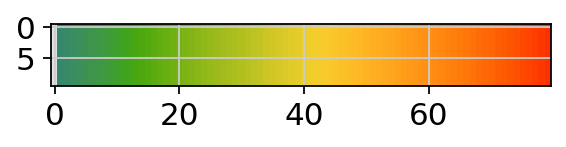

In [ ]:
import colorcet as cc

xs, _ = np.meshgrid(np.linspace(0, 1, 80), np.linspace(0, 1, 10))
colorsComb = np.vstack([pl.cm.Greys_r(np.linspace(0.8,0.1, 1)), cc.cm.rainbow_bgyr_35_85_c72(np.linspace(0.2,1, 100))])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
pl.imshow(xs, cmap=mymap);  # use tab completion to choose

# Setup

## set WD

In [ ]:
!mkdir /content/Covid/

mkdir: cannot create directory ‘/content/Covid/’: File exists


In [ ]:

folder='/content/Covid/'

samplename='CTR'
random_state=42

import os
os.chdir(folder)
if not os.path.exists('./figures'):
    os.makedirs('./figures')

# Download the data

In [ ]:
import gdown
gdown.download(url="https://drive.google.com//uc?id=1808cMgXmaXBDImDzNbCXT9L8pvAMdjwd", 
               output="covid_DC_NK.h5ad", quiet=False)



Downloading...
From: https://drive.google.com//uc?id=1808cMgXmaXBDImDzNbCXT9L8pvAMdjwd
To: /content/Covid/covid_DC_NK.h5ad
100%|██████████| 1.65G/1.65G [00:08<00:00, 207MB/s]


'covid_DC_NK.h5ad'

In [ ]:
adata = sc.read('covid_DC_NK.h5ad')
adata

AnnData object with n_obs × n_vars = 128708 × 31279
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Resample', 'Collection_Day', 'Sex', 'Age', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'initial_clustering', 'full_clustering'
    var: 'feature_types'
    uns: 'full_clustering_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [ ]:
print(adata.obs['full_clustering'].value_counts())

NK_16hi      83874
NK_56hi      26858
NK_prolif     4974
pDC           4889
DC3           3828
DC2           3617
DC1            434
DC_prolif      124
ASDC           110
Name: full_clustering, dtype: int64


In [ ]:
# remove NK cells
adata= adata[~adata.obs['full_clustering'].isin(['NK_16hi','NK_56hi','NK_prolif']),:].copy()
adata

AnnData object with n_obs × n_vars = 13002 × 31279
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Resample', 'Collection_Day', 'Sex', 'Age', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'initial_clustering', 'full_clustering'
    var: 'feature_types'
    uns: 'full_clustering_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [ ]:
print(adata.obs['full_clustering'].value_counts())

pDC          4889
DC3          3828
DC2          3617
DC1           434
DC_prolif     124
ASDC          110
Name: full_clustering, dtype: int64


In [ ]:
print(adata.obs['Status'].value_counts())

Covid        8926
Healthy      2832
Non_covid     684
LPS           560
Name: Status, dtype: int64


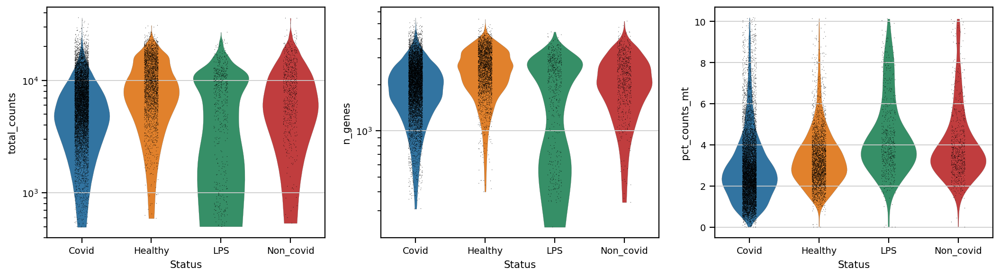

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.violin(adata, 'total_counts', groupby='Status', size=0.5, log=True, cut=0, ax=ax1, show=False)
ax2_dict =  sc.pl.violin(adata, 'n_genes', groupby='Status', size=0.5, log=True, cut=0, ax=ax2, show=False)
ax3_dict = sc.pl.violin(adata, 'pct_counts_mt', groupby='Status',size=0.5, ax=ax3, show=False,)
savefig='figures/'+samplename + '_1_QC_violin_plots.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

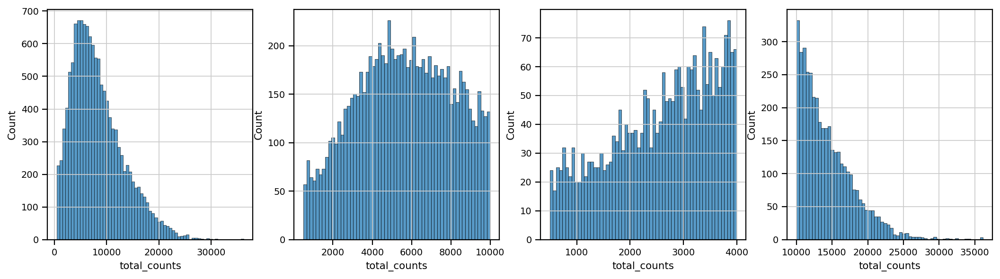

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3,ax4) = plt.subplots(1, 4, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sb.histplot(adata.obs['total_counts'], kde=False, ax=ax1,)
ax2_dict =  sb.histplot(adata.obs['total_counts'][adata.obs['total_counts']<10000], kde=False, bins=60, ax=ax2,)
ax3_dict =  sb.histplot(adata.obs['total_counts'][adata.obs['total_counts']<4000], kde=False, bins=60, ax=ax3,)
ax4_dict = sb.histplot(adata.obs['total_counts'][adata.obs['total_counts']>10000], kde=False, bins=60, ax=ax4, )
savefig='figures/'+samplename + '_2_QC_counts_filtering.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

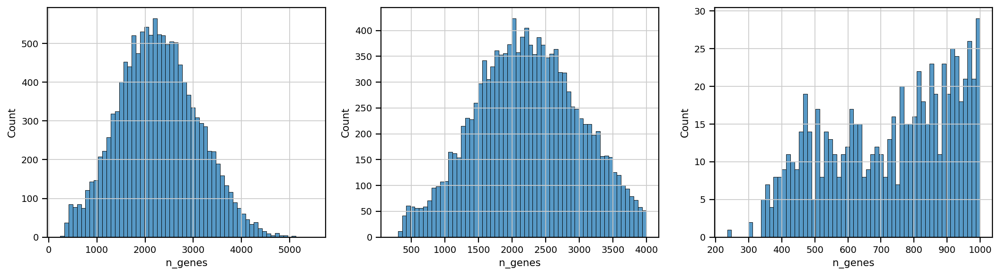

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sb.histplot(adata.obs['n_genes'], kde=False, bins=60, ax=ax1,)
ax2_dict =  sb.histplot(adata.obs['n_genes'][adata.obs['n_genes']<4000], kde=False, bins=60, ax=ax2,)
ax3_dict =  sb.histplot(adata.obs['n_genes'][adata.obs['n_genes']<1000], kde=False, bins=60, ax=ax3,)
savefig='figures/'+samplename + '_3_QC_gene_filtering.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

# Normalization

In [ ]:
#sc.experimental.pp.recipe_pearson_residuals(adata,n_top_genes=2000,n_comps=100,random_state=42,inplace=True,)
#sc.experimental.pp.recipe_pearson_residuals(adata,n_top_genes=2000,n_comps=50,random_state=42,inplace=True,batch_key= 'donnor')
@adata

AnnData object with n_obs × n_vars = 12643 × 22894
    obs: 'sample', 'condition', 'donnor', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'doublet_score', 'predicted_doublet', 'D1_CTR,D2_CTR,D3_CTR'
    var: 'gene_ids', 'feature_types', 'mito', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 'log1p_total_counts-2', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout

In [ ]:
#adata.layers["normalized"]=adata.X

## Removal of Mitochondrial and Ribosomal Protein Genes

In [ ]:
ribo_genes = adata.var_names.str.startswith(("RPS","RPL"))
mito_genes = adata.var_names.str.startswith('MT-')
malat1 = adata.var_names.str.startswith('MALAT1')
remove = np.add(ribo_genes,mito_genes)
remove = np.add(remove,malat1)
kept_genes = np.invert(remove)

In [ ]:
adata = adata[:,kept_genes]

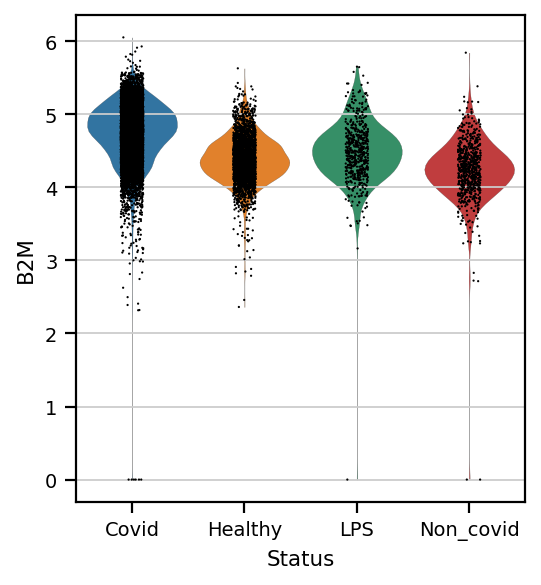

In [ ]:
sc.pl.violin(adata, ['B2M'],groupby='Status')

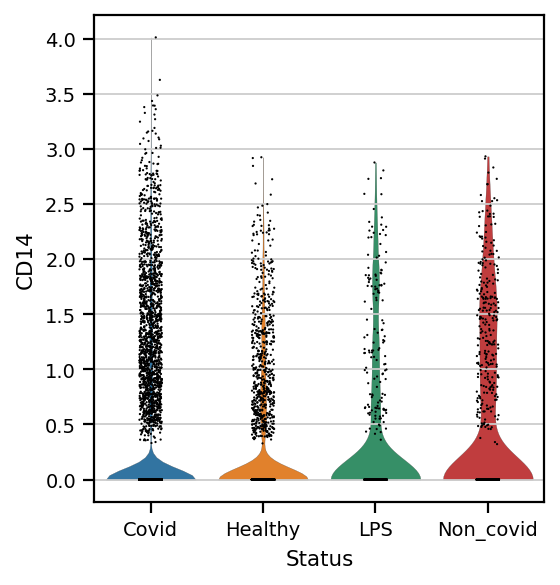

In [ ]:
sc.pl.violin(adata, ['CD14'],groupby='Status')

In [ ]:
#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))

# Min 5 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of genes: 31164


Trying to set attribute `.var` of view, copying.


Number of genes after cell filter: 14520


# Neighbors and clustering

In [ ]:
sc.pp.neighbors(adata, n_pcs=50,n_neighbors=10,random_state=random_state)
#bbknn.bbknn(adata,batch_key = "sample", neighbors_within_batch =10, n_pcs = 50)


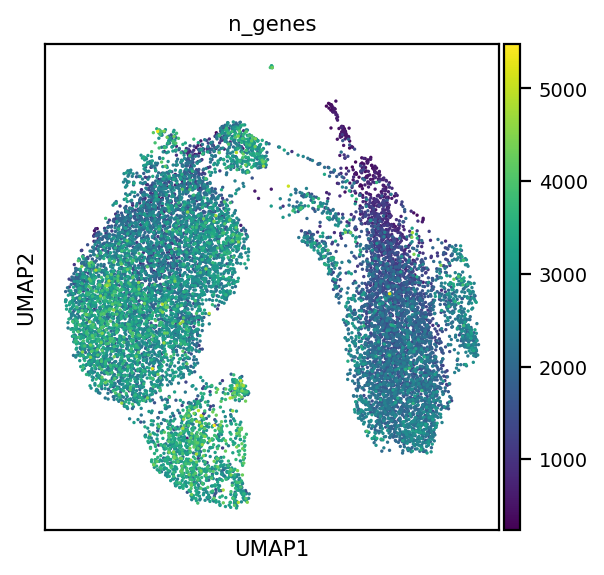

In [ ]:
genes_to_plot = ['n_genes']
#sc.tl.tsne(adata, n_jobs=8,use_rep='X', perplexity=30) 
sc.tl.umap(adata,random_state=42)
savefig="_4_QC_doublets_vst_mito.pdf"
sc.pl.umap(adata, color = genes_to_plot,ncols=2,save=savefig)

# Clustering

In [ ]:
sc.tl.leiden(adata,random_state=random_state,resolution=1.5, key_added='leiden_r1.5')
sc.tl.leiden(adata,random_state=random_state,resolution=1, key_added='leiden_r1')
sc.tl.leiden(adata,random_state=random_state, resolution=0.8, key_added='leiden_r0.8')
sc.tl.leiden(adata,random_state=random_state, resolution=0.5, key_added='leiden_r0.5')
sc.tl.leiden(adata,random_state=random_state, resolution=0.4, key_added='leiden_r0.4')
sc.tl.leiden(adata,random_state=random_state, resolution=0.3, key_added='leiden_r0.3')
sc.tl.leiden(adata,random_state=random_state, resolution=0.2, key_added='leiden_r0.2')

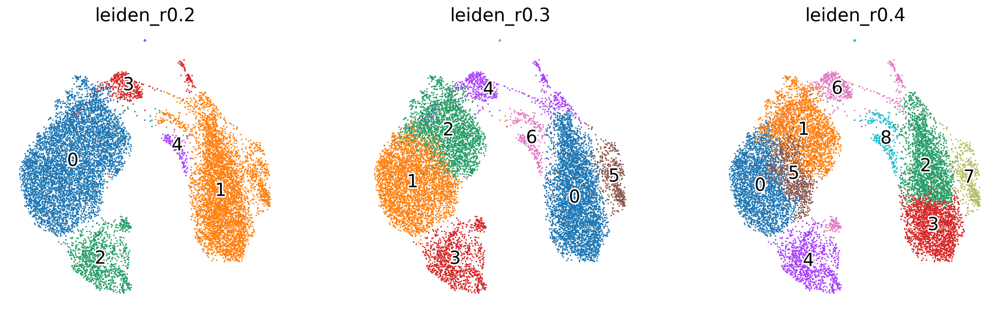

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_5_clustering_vst_lowres.pdf"
sc.pl.umap(adata, color=['leiden_r0.2','leiden_r0.3','leiden_r0.4'], legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',frameon=False,save=savefig)

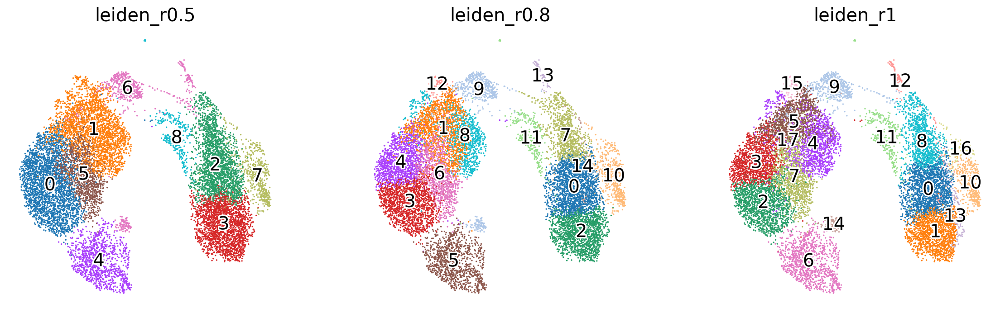

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_6_clustering_vst_hires.pdf"
sc.pl.umap(adata, color=['leiden_r0.5','leiden_r0.8','leiden_r1'], legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',frameon=False,save=savefig)

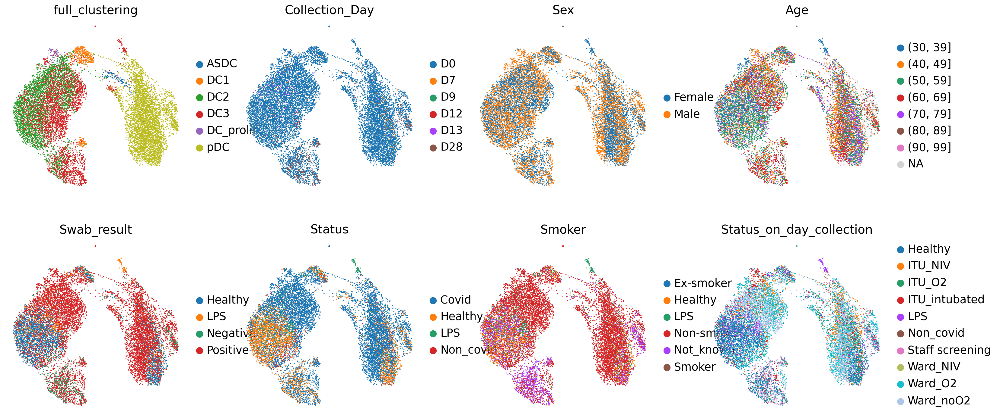

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_7_clustering.pdf"
sc.pl.umap(adata, color=['full_clustering','Collection_Day', 'Sex', 'Age', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection',],legend_fontoutline=3, legend_fontweight='normal',frameon=False,save=savefig)

In [ ]:
#sc.tl.leiden(adata, resolution=0.2, restrict_to=('leiden_r0.8', ['0']),key_added='leidenA')
#sc.tl.leiden(adata, resolution=0.2, restrict_to=('leidenA', ['4,1']),key_added='leidenB')

In [ ]:
print(adata.obs['Status'].value_counts())

Covid        8926
Healthy      2832
Non_covid     684
LPS           560
Name: Status, dtype: int64


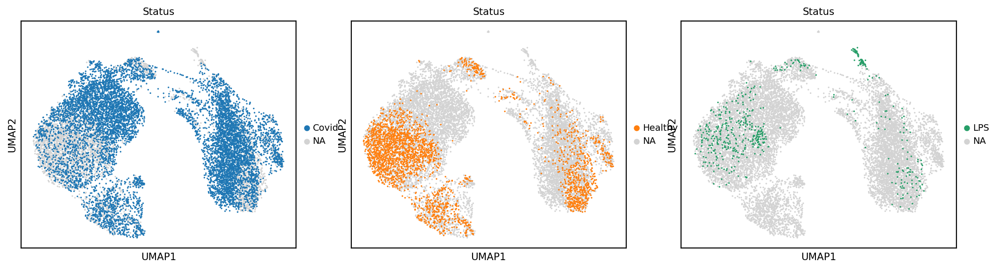

In [ ]:
sb.set_context('paper')
pl.rcParams['lines.linewidth'] = 0.1
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = pl.subplots(1, 3, figsize=(16,4), gridspec_kw={'wspace':0.2})

ax1_dict = sc.pl.umap(adata, color='Status', groups=['Covid'], ax=ax1, show=False)
ax2_dict =  sc.pl.umap(adata, color='Status', groups=['Healthy'], ax=ax2, show=False)
ax3_dict = sc.pl.umap(adata, color='Status', groups=['LPS'], ax=ax3, show=False,)
savefig='figures/'+samplename + '_9_dataintegration.pdf'
fig.savefig(savefig, dpi=300, bbox_inches='tight')

In [ ]:
#ax = sc.pl.umap(adata, size=10, show=False)
#sc.pl.umap(adata[adata.obs["donnor"] == "D1"],color=[ 'condition'],ax=ax)

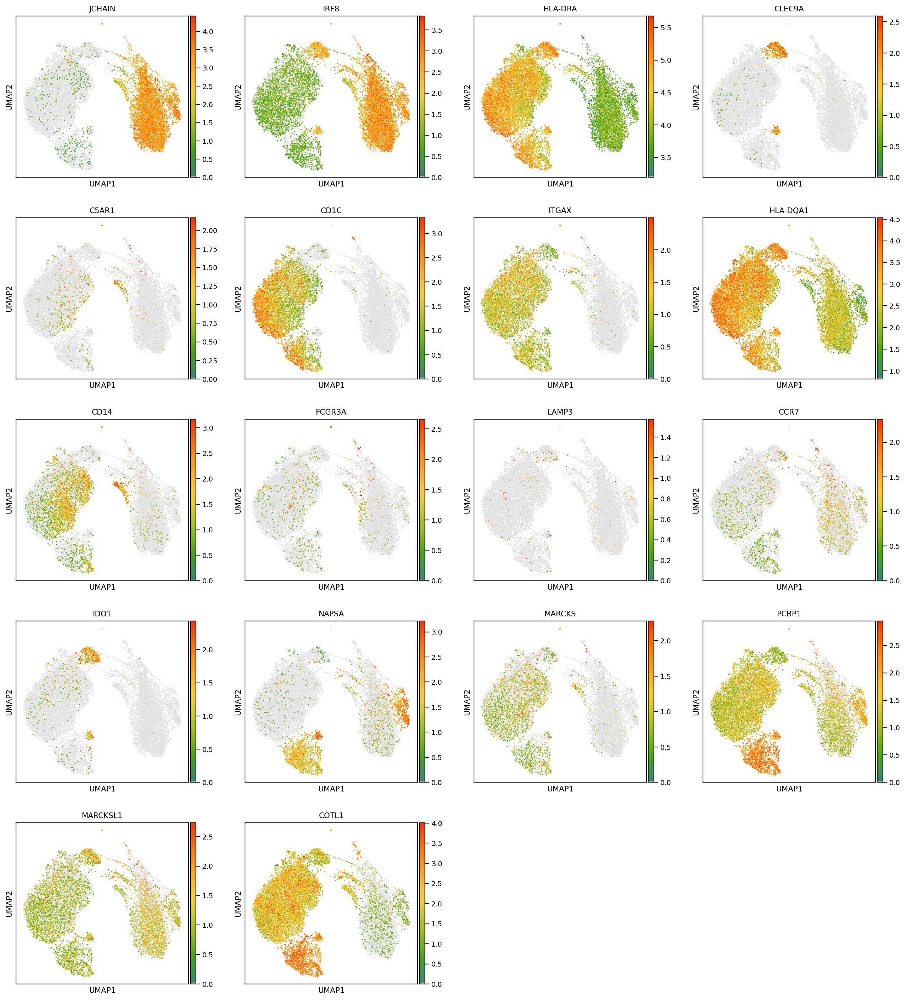

In [ ]:
marker_genes = ['JCHAIN','IRF8','HLA-DRA','CLEC9A','C5AR1','CD1C','ITGAX','HLA-DQA1','CD14','FCGR3A','LAMP3','CCR7','IDO1','NAPSA','MARCKS','PCBP1','MARCKSL1','COTL1']
sb.set_context('paper')
pl.rcParams['figure.figsize']=(4,4) #rescale figures
savefig=samplename+"_10_markers_1.pdf"
sc.pl.umap(adata=adata, color=marker_genes,color_map=mymap,vmin='p10', vmax='p99.9',ncols=4,
           legend_loc='on data',legend_fontoutline=3, legend_fontweight='normal',use_raw=False, save=savefig)

# Marker genes

In [ ]:
#method : {‘logreg’, ‘t-test’, ‘wilcoxon’, ‘t-test_overestim_var’} | None (default: None)
sc.tl.rank_genes_groups(adata, 'leiden_r1', method='wilcoxon',n_genes=adata.shape[1])
markers=pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(50)
markers

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,ITM2C,GZMB,FCER1A,HLA-DPB1,IFITM3,IFITM3,MTRNR2L12,S100A9,AB_CD123,CD74,NAPSA,CFD,AB_CR1,IGLC3,NAPSA,HMGN2,PPBP,PPBP
1,IRF7,LILRA4,CD1C,CST3,IFITM2,IFITM1,PCBP1,S100A8,AB_CD45RA,HLA-DPA1,MTRNR2L12,S100A6,AB_CD19,IGLC2,MTRNR2L12,PTMA,NRGN,TUBB1
2,GZMB,PLD4,CLEC10A,HLA-DRB1,IFI6,IFITM2,COTL1,FCN1,AB_LAIR1,CLEC9A,RHEX,PLAC8,AB_CD20,NPC2,SNX3,HMGB1,AB_ITGA6,PF4
3,LILRA4,ITM2C,HLA-DPB1,HLA-DRA,IFITM1,IFI6,NAPSA,VCAN,AB_CD38,C1orf54,PPP1R14B,S100A8,AB_CD21,LRRC26,C1orf54,TUBA1B,SPARC,CAVIN2
4,JCHAIN,JCHAIN,HLA-DRA,CD1C,IFI30,LY6E,CEBPD,TSPO,IRF7,SNX3,AB_CD303,NEAT1,AB_IgM,JCHAIN,CLEC9A,HMGB2,AB_ITGA2B,CCL5
5,PLD4,IL3RA,CPVL,HLA-DPA1,TYMP,TMSB10,PCBP2,FTL,TCF4,CPNE3,JCHAIN,CTSD,AB_IgD,CLIC3,DUSP2,DEK,CLU,GP9
6,SEC61B,SERPINF1,HLA-DRB1,CD74,LY6E,ISG15,KLF4,S100A6,MZB1,RGS10,ODC1,CD14,AB_CD52,PLD4,PCBP1,STMN1,TUBB1,MYL9
7,SPCS1,ALOX5AP,JUNB,HLA-DQA1,MT2A,IFI27,RAC1,S100A4,AB_CD71,GYPC,C12orf75,STXBP2,TXNIP,GZMB,CPNE3,RAN,AB_ITGA2,GNG11
8,MZB1,PTCRA,FOS,FCER1A,TIMP1,CST3,IER2,LYZ,AB_ICAM1,HLA-DPB1,GAS6,AB_CR1,AB_CD45RA,PTCRA,PCBP2,TYMS,CAVIN2,MPIG6B
9,ALOX5AP,CYB561A3,VIM,CFP,PLAUR,C1orf162,KLF2,IFI30,JCHAIN,AB_CD141,COMMD6,AB_ITGAM,AB_CD22,IL3RA,COTL1,ANP32B,AB_SELP,NRGN


In [ ]:
savetable=samplename+"_marker_genes_leidenr1.csv"
markers.to_csv(savetable)

In [ ]:
sc.tl.rank_genes_groups(adata, 'leidenB', method='t-test', groups= ['4'], reference='1',key_added = "wilcoxon")
#sc.tl.rank_genes_groups(adata, 'leiden_r1', method='t-test',key_added = "wilcoxon")
sc.get.rank_genes_groups_df(adata, group='4', key='wilcoxon',log2fc_min=5)

# Known markers

In [ ]:
adata.obs['leiden_r1'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18'],
      dtype='object')

In [ ]:
adata.obs.annotated = adata.obs.leiden_r1.cat.reorder_categories([
'3','11','12','14','2','1','6','8','9','0','5','7','10','4','13','15','16', '17', '18' ])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  


In [ ]:
marker_genes_dict = {
    'pDC': ['JCHAIN','IRF8','PTPRS','RHEX',],
    'mregDC':['LAMP3','SLCO5A1','IDO1','MARCKS','CRLF2','MARCKSL1',],
    'DC3':['PLA2G7','ITGAX','FCER1G','PTPRE','DOCK4','LYZ','C15orf48','CYP1B1','STAB1','CYP27A1','GPR68','CD14'],
    'DC2':['SYT17','EDN1','CTLA4','INHBA','SPRED1','FMNL2','IL1RN',],
    'NK': ['GNLY','KLRD1','C1orf21','LINC00996','TXK','ZBTB16','NCAM1',],
    'T-cell': ['IL7R','CD3D','CD3G','LTB','CCL5','CD247'],
    'B-cell': ['CD79A', 'MS4A1','AFF3','IGKC','IGHM','BANK1']
}

In [ ]:
sb.set_context('paper')
savefig=samplename+"_Dotplot_markers_all.pdf"
sc.pl.dotplot(adata, 
                  var_names=marker_genes_dict,
                  vmin=-2, vmax=2, cmap='RdBu_r', groupby='leidenB', return_fig=False, dendrogram=False,save=savefig)

In [ ]:
sb.set_context('paper')
pl.rcParams['figure.figsize']=(5,5)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_clustering_hires_vst.pdf"
sc.pl.umap(adata, color=['leidenB'], legend_loc='on data',legend_fontoutline=3,legend_fontsize='small', legend_fontweight='normal',frameon=False,save=savefig)

In [ ]:
sb.set_context('paper')
savefig=samplename+"_Dotplot_markers_all.pdf"
sc.pl.dotplot(adata, 
                  var_names=marker_genes_dict,
                  vmin=-2, vmax=2, cmap='RdBu_r', groupby='leidenB', return_fig=False, dendrogram=False,save=savefig)

In [ ]:
adata.obs['scorect'].cat.categories

Index(['Plasmablast', 'CD4.Naive', 'CD8.Naive', 'CD4.IL22', 'gdT', 'DC3',
       'CD16_mono', 'NK_56hi', 'NKT', 'DC1', 'pDC', 'MAIT'],
      dtype='object')

In [ ]:
adata.obs['annotated'] = adata.obs['leidenB'].cat.add_categories(['pDC','mregDC','DC3','DC2','Bcells','NKcells','NKT','gdTC','MAIT','CD8naive','CD4memory','CD4naive'])

adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['7'])] = 'pDC'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['6',])] = 'mregDC'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['3,0'])] = 'DC3'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['3,1'])] = 'DC2'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['0'])] = 'Bcells'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['4'])] = 'NKcells'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['5'])] = 'NKT'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['2'])] = 'gdTC'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['8'])] = 'MAIT'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['1,1'])] = 'CD8naive'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['1,2'])] = 'CD4memory'
adata.obs['annotated'][np.in1d(adata.obs['annotated'], ['1,0'])] = 'CD4naive'

adata.obs['annotated'] = adata.obs['annotated'].cat.remove_unused_categories()

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(7,7)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_annotated_hires_annotated.pdf"
sc.pl.umap(adata, color=['annotated'], legend_loc='on data',cmap=mymap,legend_fontoutline=3,vmax='p99.9',legend_fontsize='small', legend_fontweight='normal',frameon=False,save=savefig)

In [ ]:
cluster=samplename+"_Annotated.h5ad"
adata.write(cluster)

In [ ]:
cluster=samplename+"_Annotated.h5ad"
adata=sc.read(cluster)
adata

In [ ]:
sb.set_context('talk')
pl.rcParams['figure.figsize']=(5,5)
#sc.tl.leiden(adata,random_state=random_state, resolution = 0.5)
savefig=samplename+"_clustering_vst_bbknn.pdf"
sc.pl.umap(adata, color=['HLA-DRA','C5AR1','FCAR','FCER1A','CD14',"CLEC9A",'CD1C','CCR7','FCGR3A','CD163','NEAT1','LCK','CD3E','LMNA'],cmap=mymap,legend_fontoutline=3, 
           hspace=0.5,wspace=0.5,legend_fontweight='normal',frameon=False,save=savefig)